Charles Vin & Aymeric Delefosse <span style="float:right">DAC</span>

# TME 03 - Opérateurs d'agrégation et LIME


In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt


## A - Opérateurs d'agrégation

>


<div class="alert alert-block alert-warning">
L'objet de la 1ère partie de TME est de tracer les lignes de niveaux des opérateurs d'agrégation vus en cours
</div>


<div class="alert alert-block alert-info">
    Ecrire une fonction qui calcule la moyenne pondérée d'un vecteur <code>x</code> en fonction d'un vecteur <code>poids</code>
</div>


In [2]:
def weighted_mean(x, poids):
    assert len(x) == len(poids)
    return (x * poids).sum() / poids.sum()


<div class="alert alert-block alert-info">
    Ecrire une fonction qui trace les lignes de niveaux d'un opérateur, en l'appliquant à des vecteurs de taille 2.
</div>


In [3]:
import numpy as np
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D

# %matplotlib widget


def plot_level_lines(
    operator, x_range=[0, 1], y_range=[0, 1], num_contours=10, title=None
):
    """
    Trace les lignes de niveaux d'un opérateur d'agrégation.

    :param operator: Fonction d'agrégation à tracer.
    :param x_range: Plage de valeurs pour la première composante du vecteur, [0, 1] par défaut.
    :param y_range: Plage de valeurs pour la deuxième composante du vecteur, [0, 1] par défaut.
    :param num_contours: Nombre de contours à tracer, 10 par défaut.
    """
    x_values = np.linspace(x_range[0], x_range[1], 100)
    y_values = np.linspace(y_range[0], y_range[1], 100)
    X, Y = np.meshgrid(x_values, y_values)
    Z = np.zeros_like(X)

    for i in range(X.shape[0]):
        for j in range(X.shape[1]):
            Z[i, j] = operator([X[i, j], Y[i, j]])

    fig = plt.figure(figsize=(12, 5))
    if title:
        fig.suptitle(title)
    # Lignes de niveaux en 2D
    plt.subplot(1, 2, 1)
    plt.contourf(X, Y, Z, levels=num_contours)
    plt.colorbar(label="Function Value")
    plt.xlabel("$u$")
    plt.ylabel("$v$")
    plt.title(f"2D Contour Plot")

    # Lignes de niveaux en 3D
    plt.subplot(1, 2, 2, projection="3d")
    ax = plt.gca()
    ax.plot_surface(X, Y, Z, cmap="viridis")
    ax.set_xlabel("$u$")
    ax.set_ylabel("$v$")
    ax.set_zlabel("Function Value")
    plt.title("3D Surface Plot")

    plt.tight_layout()
    plt.show()


<div class="alert alert-block alert-info">
    Ecrire une fonction qui calcule un OWA d'un vecteur <code>x</code> en fonction d'un vecteur <code>poids</code>
</div>


In [4]:
def owa(x, poids):
    assert len(x) == len(poids)
    return np.dot(np.sort(x), poids)


<div class="alert alert-block alert-info">
    Visualiser les lignes de niveaux de différentes configurations des moyennes pondérées et des OWA pour différents vecteurs de poids.    
</div>


### OWA


Pour obtenir des plots 3D interactif, exécutez le notebook en décommentant la ligne suivante


In [5]:
# %matplotlib widget


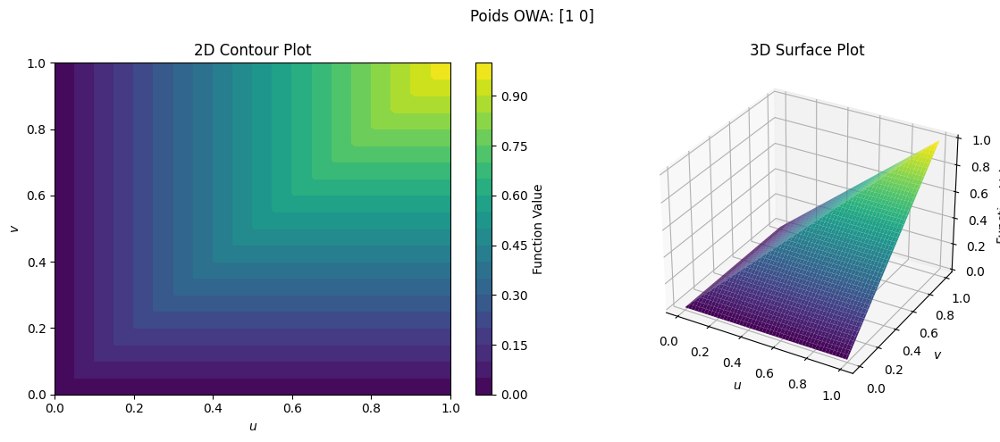

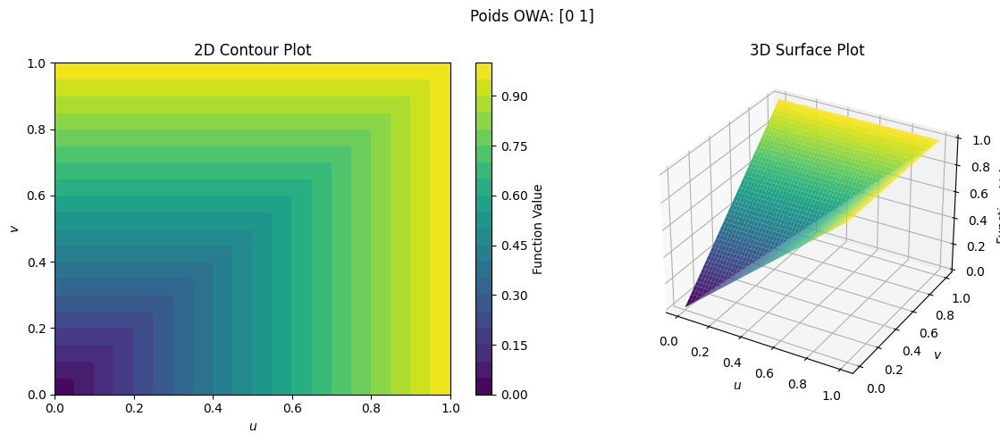

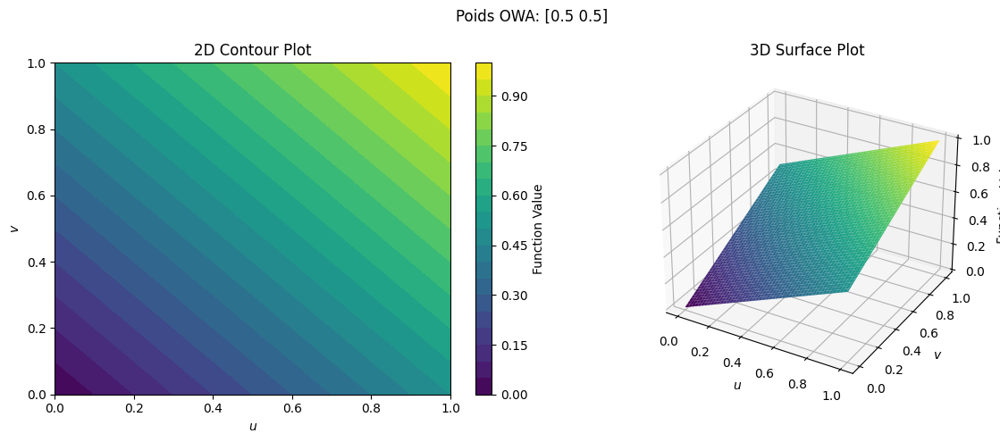

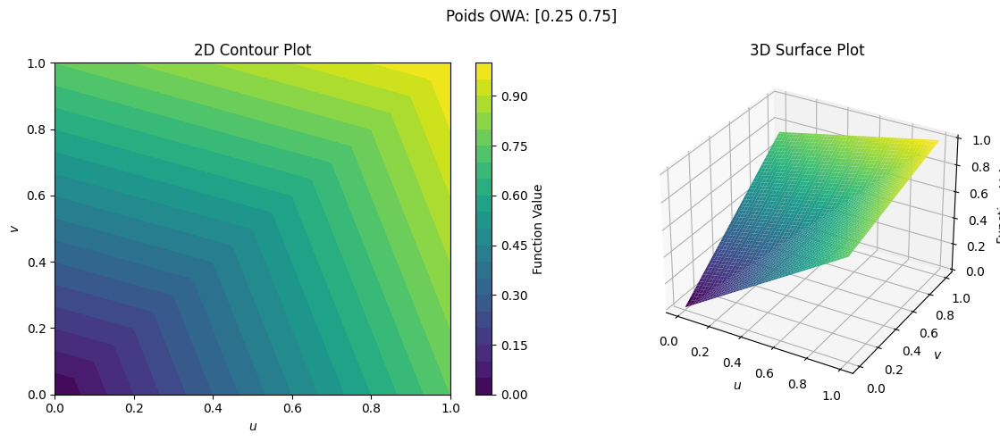

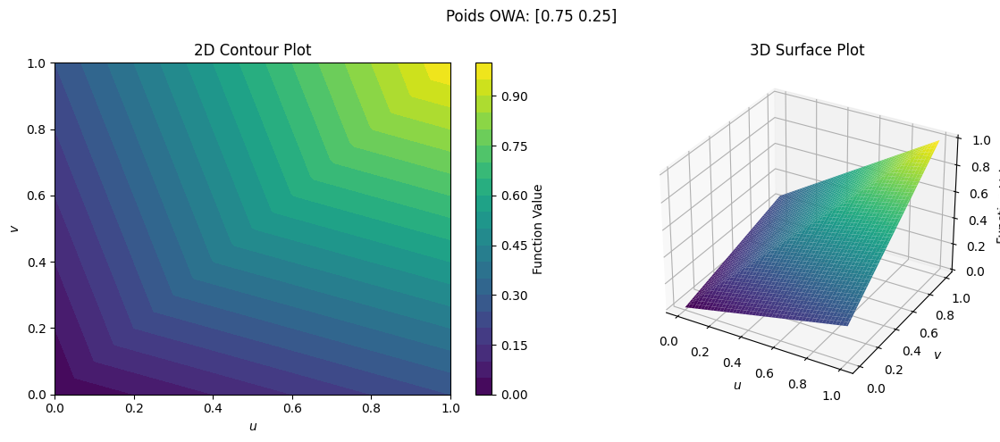

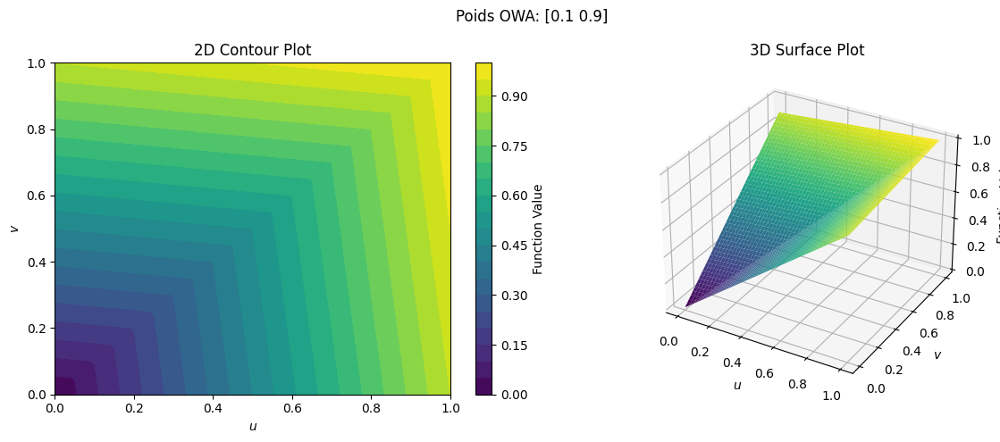

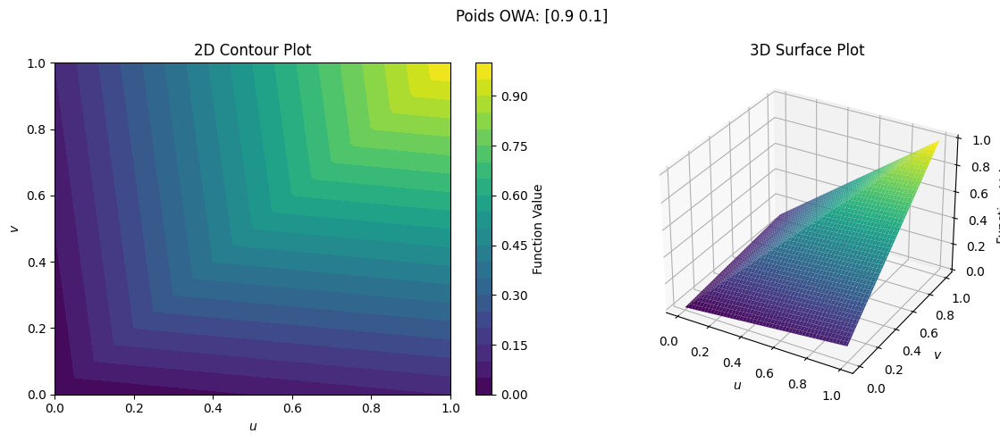

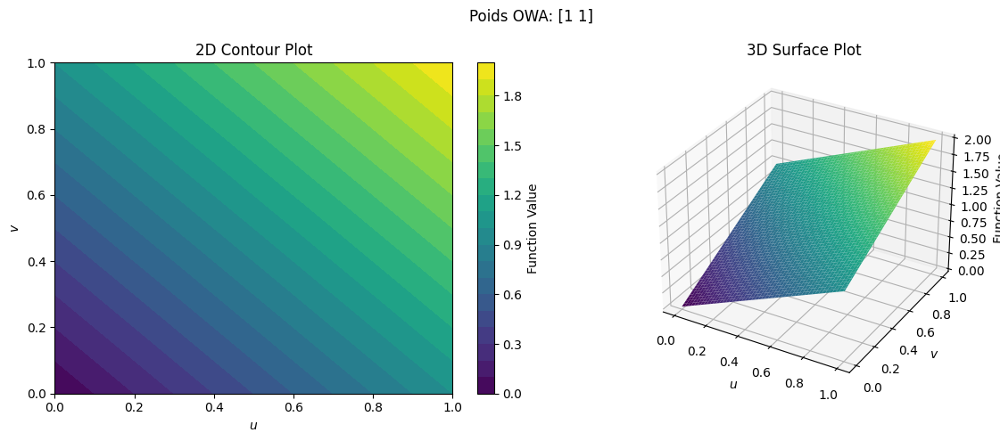

In [6]:
liste_poids = [
    np.array([1, 0]),
    np.array([0, 1]),
    np.array([0.5, 0.5]),
    np.array([0.25, 0.75]),
    np.array([0.75, 0.25]),
    np.array([0.1, 0.9]),
    np.array([0.9, 0.1]),
    np.array([1, 1]),
]

for poids in liste_poids:
    plot_level_lines(
        lambda x: owa(x, poids), num_contours=20, title=f"Poids OWA: {poids}"
    )


### Moyenne pondérée


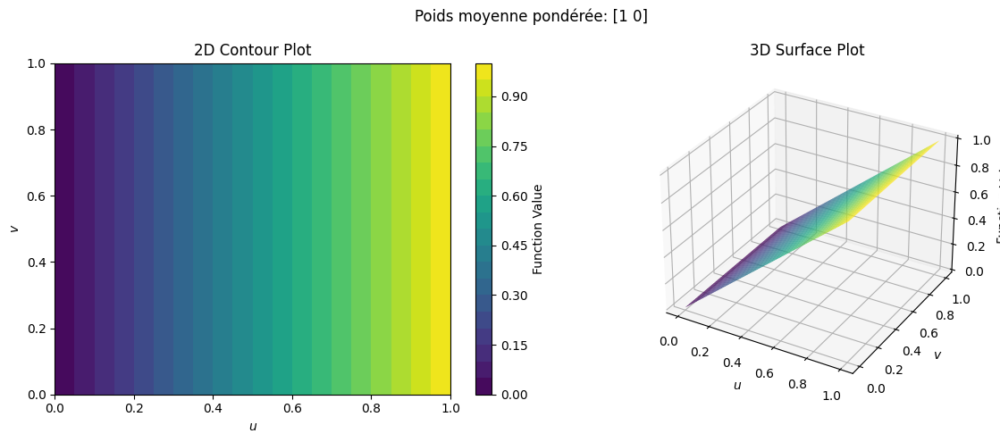

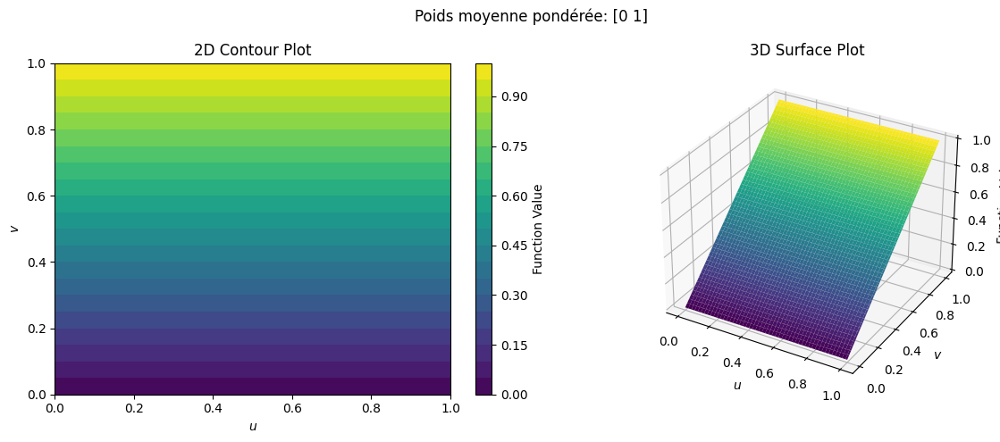

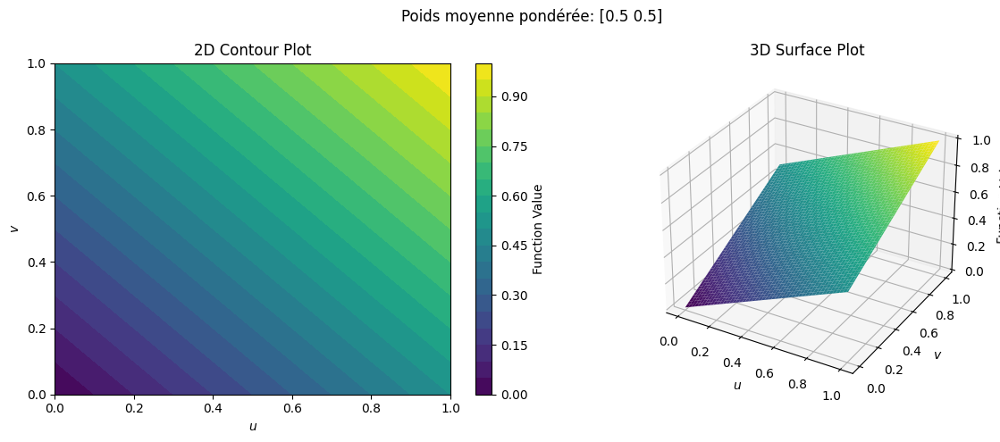

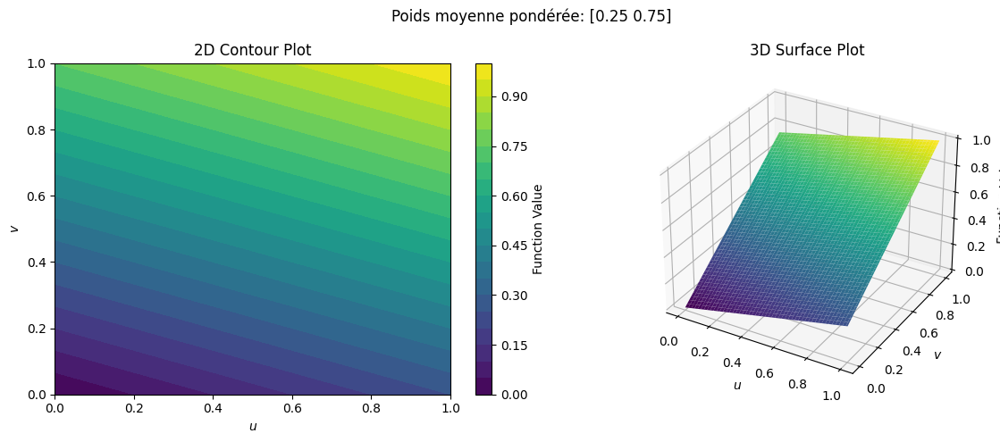

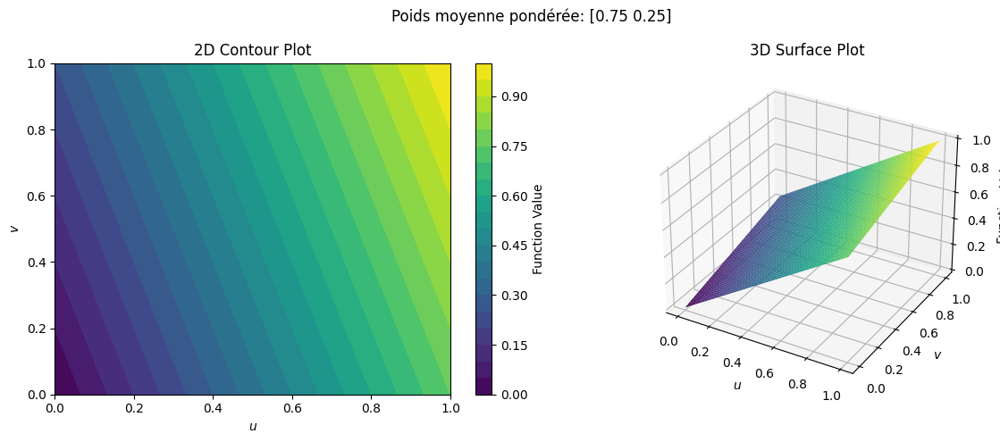

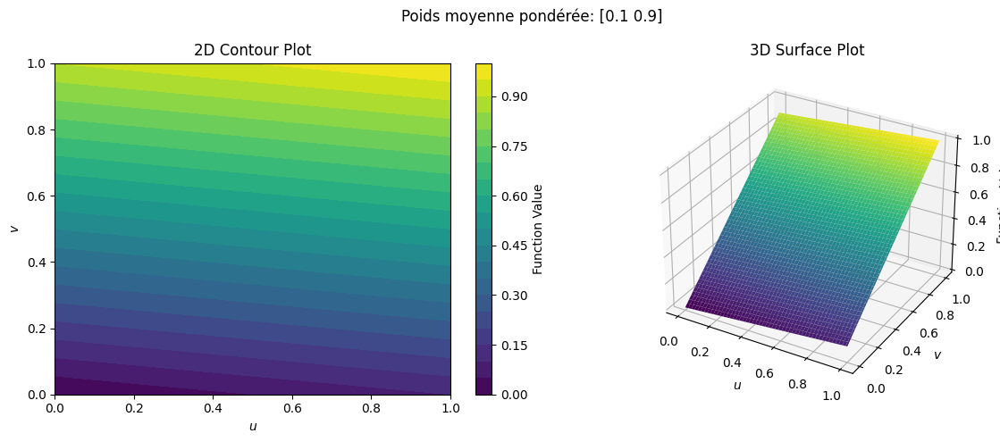

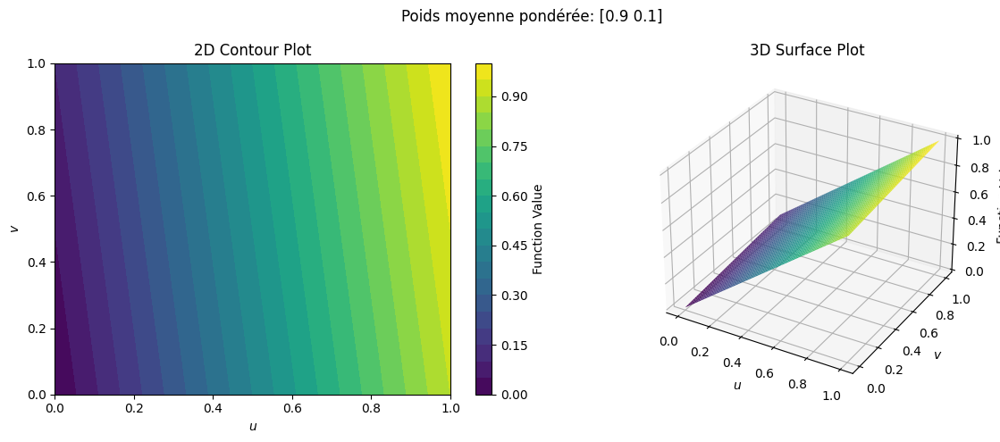

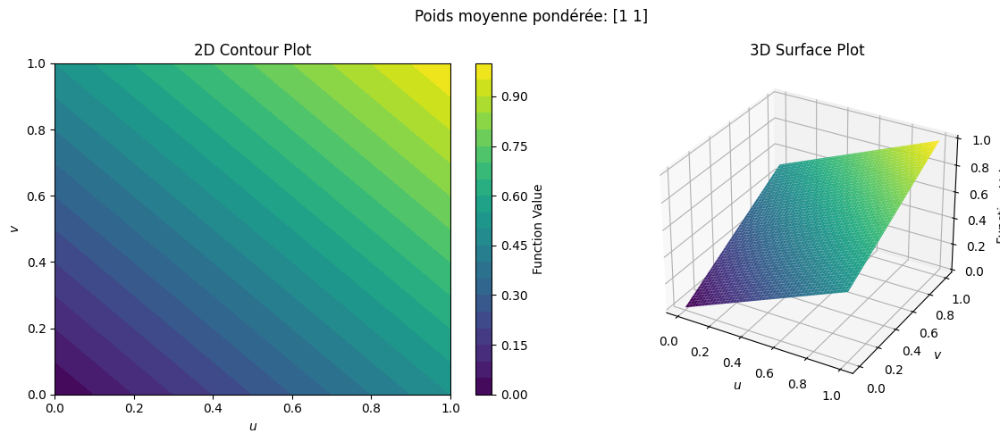

In [7]:
for poids in liste_poids:
    plot_level_lines(
        lambda x: weighted_mean(x, poids),
        num_contours=20,
        title=f"Poids moyenne pondérée: {poids}",
    )


<div class="alert alert-block alert-info">
    Visualiser aussi les lignes de niveaux des opérateurs conjonctifs et disjonctifs vus en cours, ainsi que l'opérateur à comportement variable (intégrale de Gödel), après avoir défini les fonctions permettant de calculer ces opérateurs.
</div>


In [8]:
class OperateurConjonctif:
    def min(vector):
        return np.minimum(vector[0], vector[1])

    def max(vector):
        return np.maximum(vector[0] + vector[1] - 1, 0)

    def product(vector):
        return vector[0] * vector[1]


class OperateurDisjonctif:
    def min(vector):
        return np.minimum(vector[0] + vector[1], 1)

    def max(vector):
        return np.maximum(vector[0], vector[1])

    def product(vector):
        return vector[0] + vector[1] - vector[0] * vector[1]


class OperateurCompromis:
    def moyenne(vector):
        return vector.mean()


### Opérateurs conjonctifs


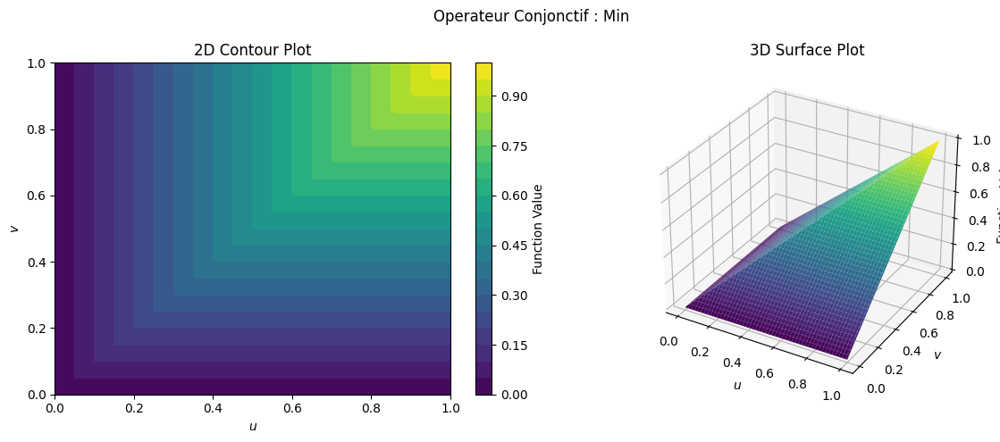

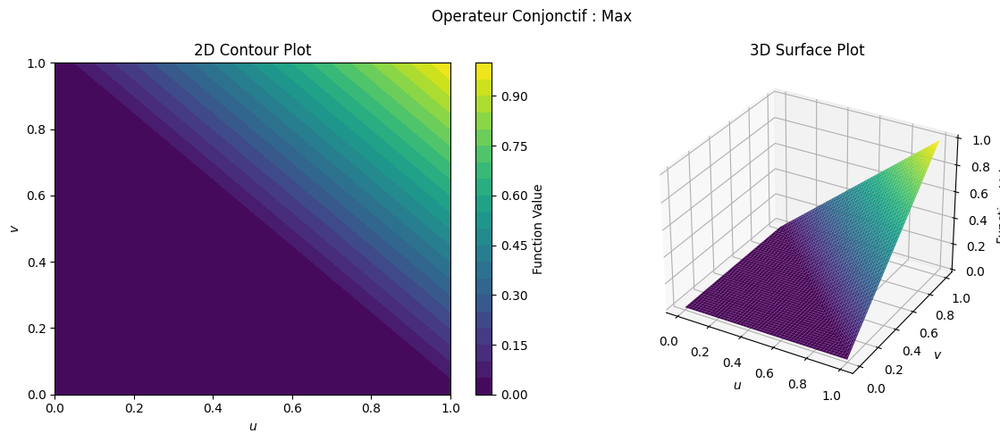

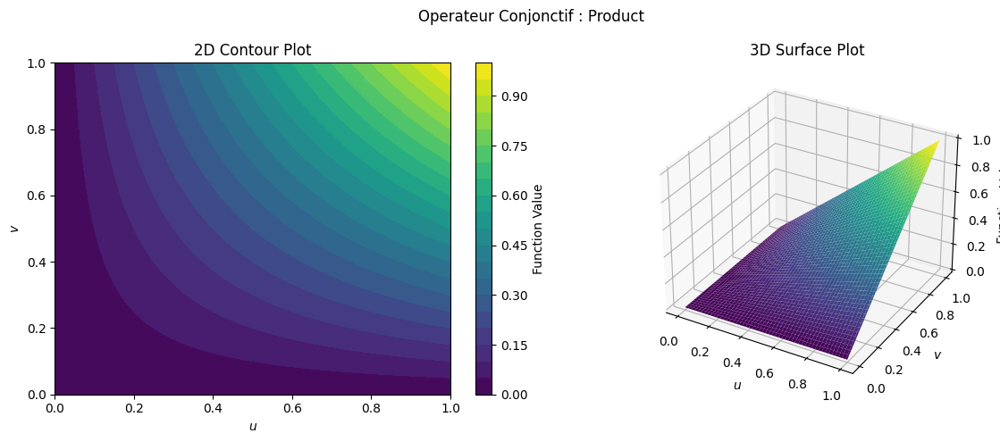

In [9]:
plot_level_lines(
    OperateurConjonctif.min, num_contours=20, title="Operateur Conjonctif : Min"
)
plot_level_lines(
    OperateurConjonctif.max, num_contours=20, title="Operateur Conjonctif : Max"
)
plot_level_lines(
    OperateurConjonctif.product, num_contours=20, title="Operateur Conjonctif : Product"
)


### Opérateurs disjonctifs


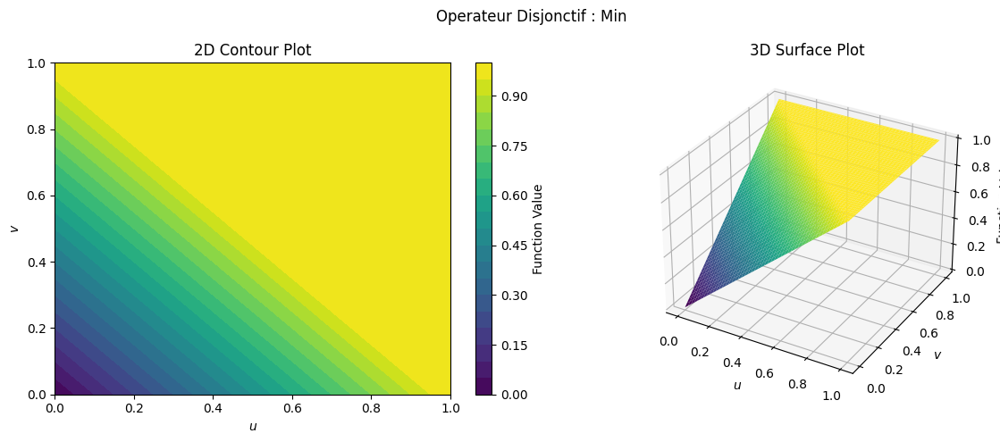

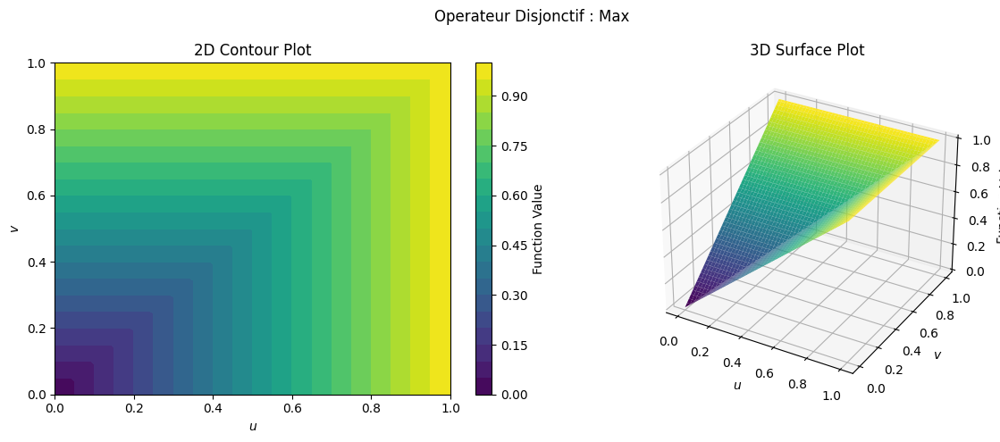

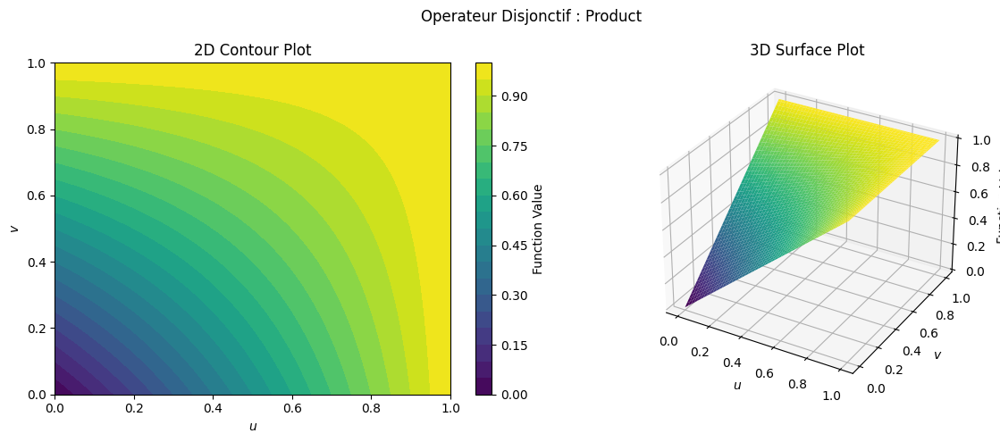

In [10]:
plot_level_lines(
    OperateurDisjonctif.min, num_contours=20, title="Operateur Disjonctif : Min"
)
plot_level_lines(
    OperateurDisjonctif.max, num_contours=20, title="Operateur Disjonctif : Max"
)
plot_level_lines(
    OperateurDisjonctif.product, num_contours=20, title="Operateur Disjonctif : Product"
)


### Opérateurs de compromis (moyenne)


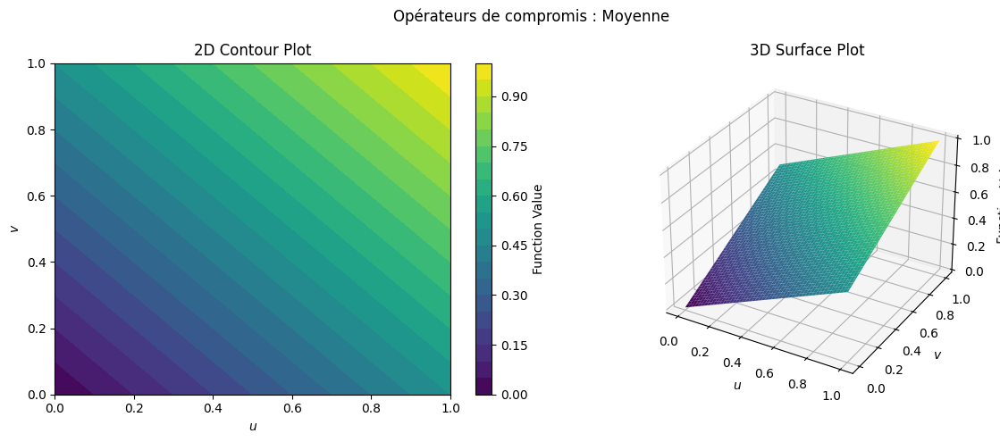

In [11]:
plot_level_lines(np.mean, num_contours=20, title="Opérateurs de compromis : Moyenne")


### Intégrales de Gödel (opérateur à attitude variable)


In [12]:
import numpy as np


def godel_integral(vector, poids):
    """
    Calcule l'opérateur intégral de Gödel pour un vecteur d'entrée x et un vecteur de poids w.

    :param vector: Vecteur d'entrée.
    :param weights: Vecteur de poids.
    :return: Résultat de l'opérateur des intégrales de Gödel.
    """
    assert len(vector) == len(poids)
    u, v = vector[0], vector[1]
    alpha, beta = poids[0], poids[1]

    if u <= 1 - alpha and v <= 1 - beta:
        return np.minimum(u, v)
    elif u > 1 - alpha and v > 1 - beta:
        return np.maximum(u, v)
    elif u > 1 - alpha and v <= 1 - beta:
        return u
    elif u <= 1 and v > 1 - beta:
        return v


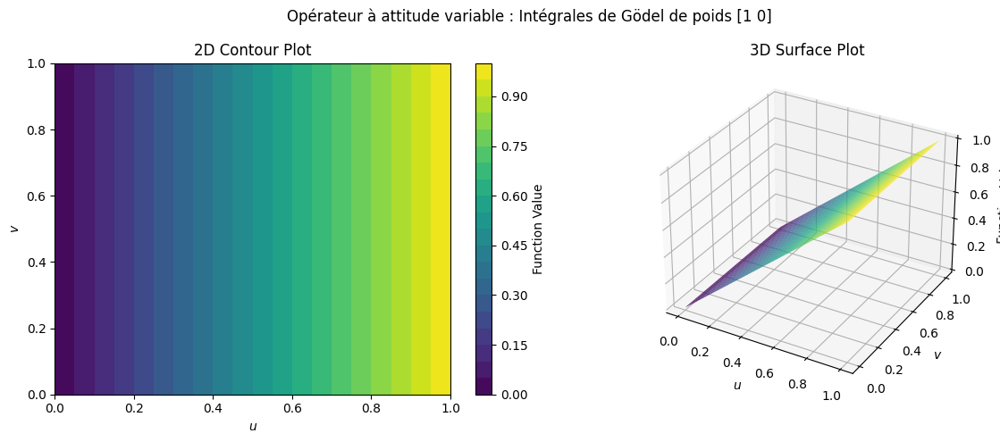

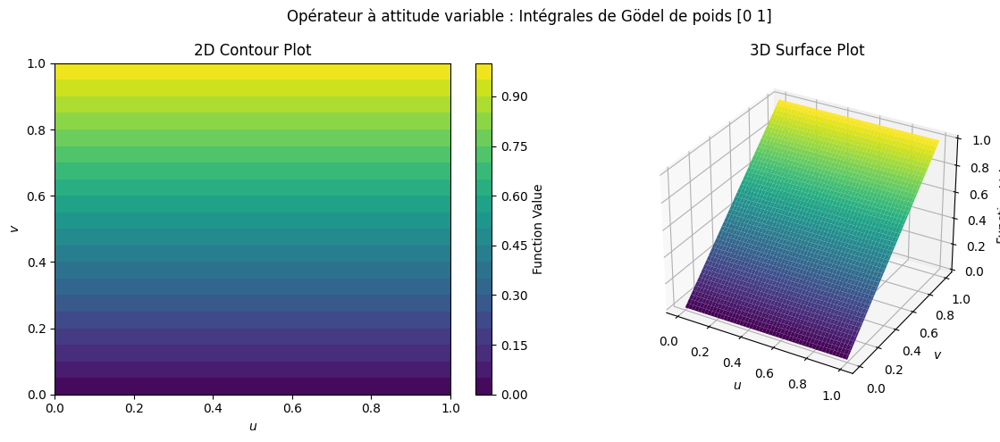

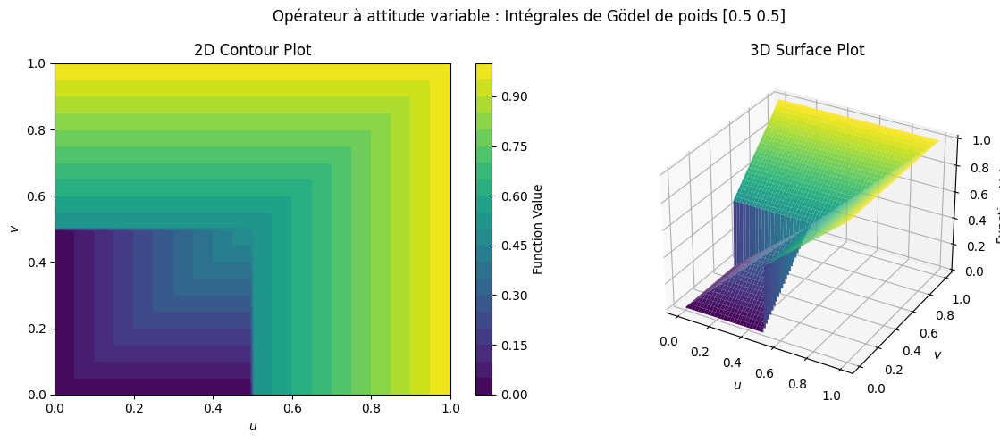

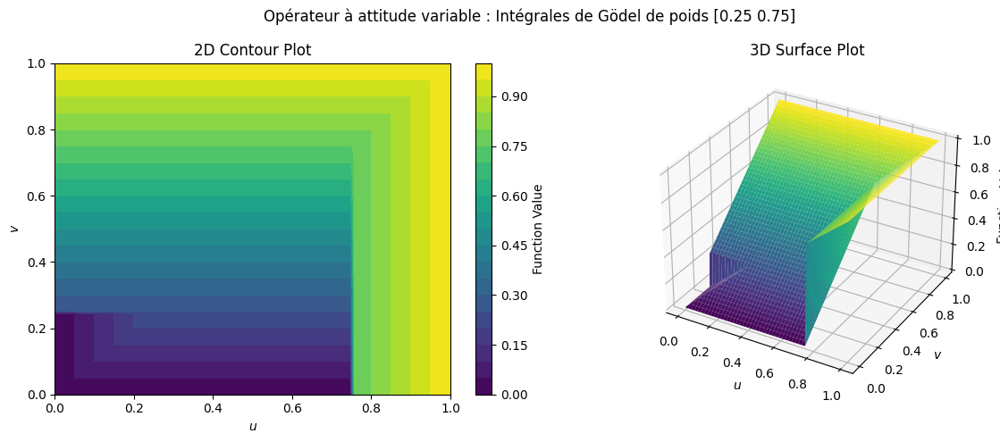

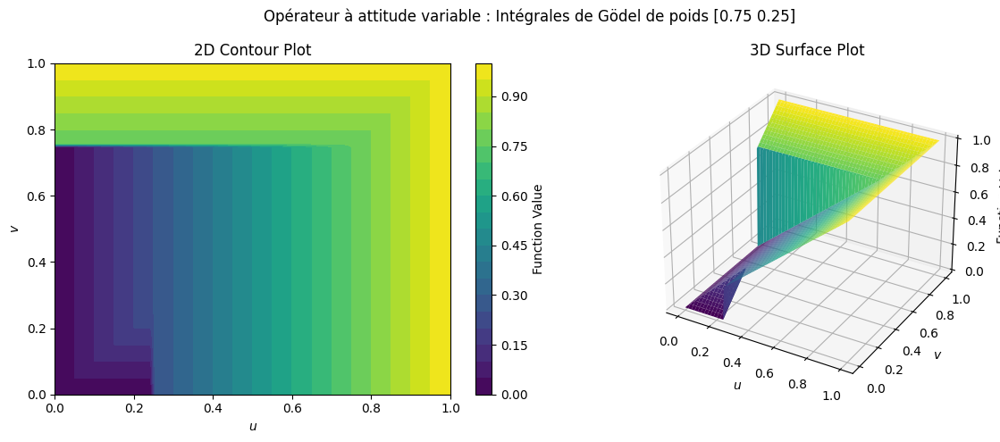

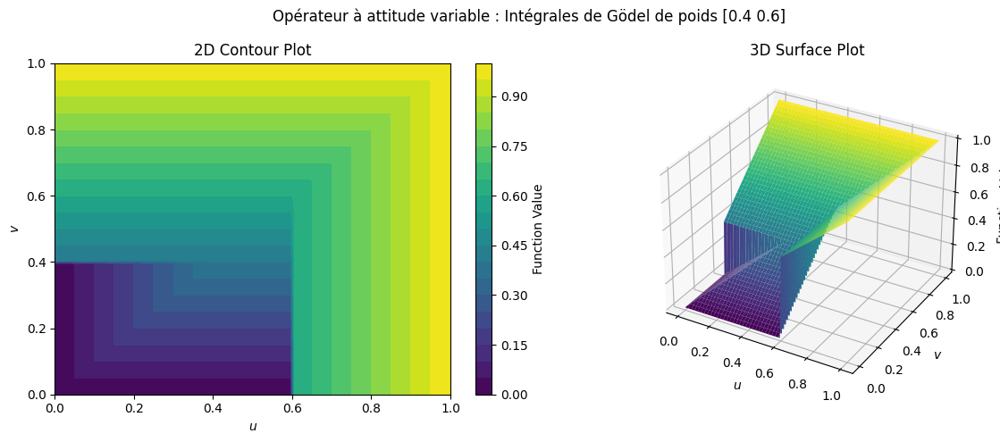

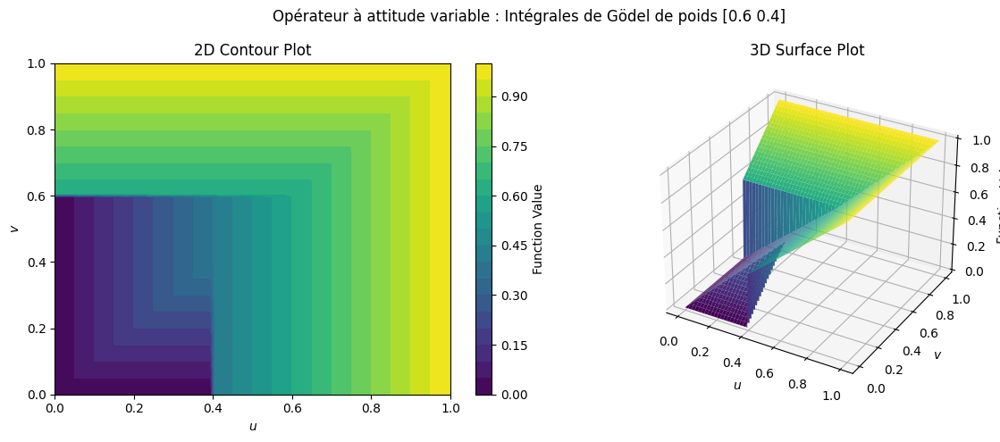

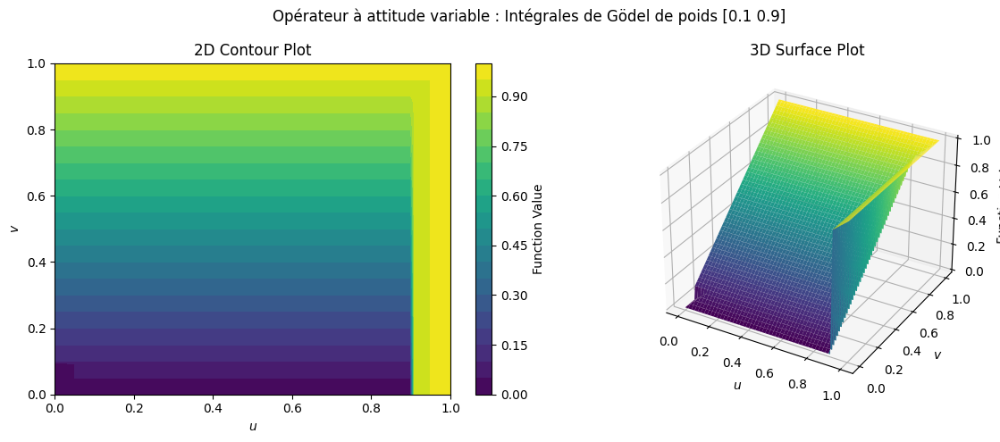

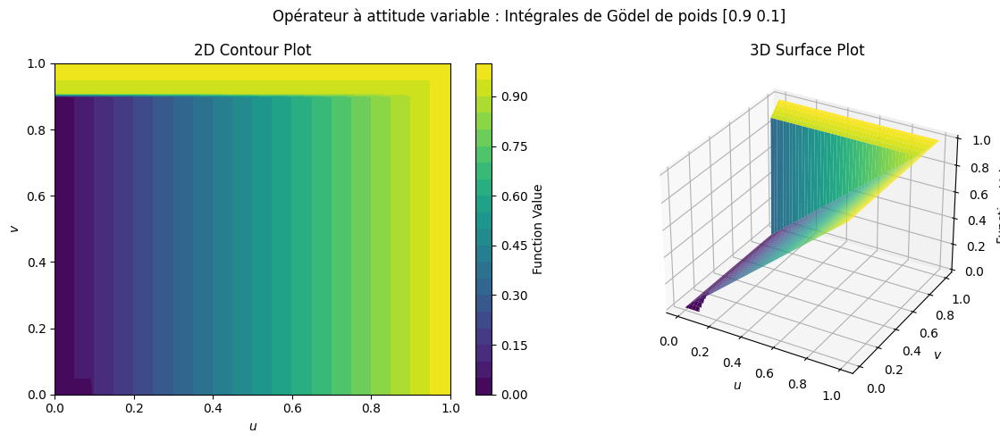

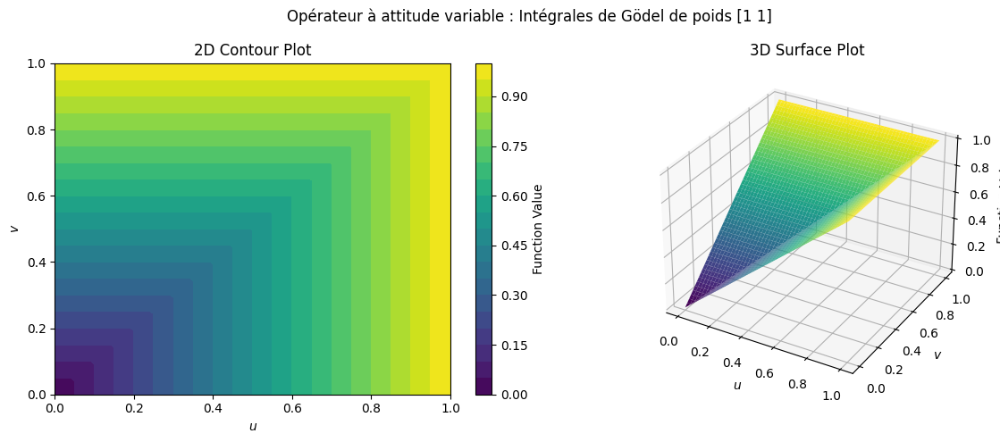

In [13]:
liste_poids = [
    np.array([1, 0]),
    np.array([0, 1]),
    np.array([0.5, 0.5]),
    np.array([0.25, 0.75]),
    np.array([0.75, 0.25]),
    np.array([0.4, 0.6]),
    np.array([0.6, 0.4]),
    np.array([0.1, 0.9]),
    np.array([0.9, 0.1]),
    np.array([1, 1]),
]

for poids in liste_poids:
    plot_level_lines(
        lambda x: godel_integral(x, poids),
        num_contours=20,
        title=f"Opérateur à attitude variable : Intégrales de Gödel de poids {poids} ",
    )


<div class="alert alert-block alert-info">
    Ecrire une fonction qui calcule l'intégrale de Choquet d'un vecteur <code>x</code> en fonction d'une capacité <code>mu</code>.<br>
    La fonction ne doit pas imposer de restriction au nombre de composantes de <code>x</code>, sa documentation doit expliciter la représentation choisie pour <code>mu</code>, la fonction doit inclure une vérification que <code>mu</code> satisfait les propriétés d'une capacité.
    
</div>


- $ \sigma $ représente les indices de $x$ **triés** ;
- Les $ A\_{\sigma(i)} $ sont représentés par des `frozenset` d'indice de $x$ **triés** ;
- $\mu$ doit être défini de manière assez précise : il prend la forme d'un dictionnaire avec pour clé un $ A*{\sigma(i)} $ qui est donc un `frozenset()` dans l'implémentation. La valeur associée à cette clé est la valeur de $ \mu(A*{\sigma(i)}) $. Chaque valeur $i$ dans le `frozenset()` est associée à la valeur d'indice $i$ du $x$ trié ($=\sigma (i)$).

Pour créer le dictionnaire $\mu$ :

1. Définir un $x$ ;
2. Trier $x$ ;
3. Choisir les indices $\sigma(i)$ du $x$ trié pour obtenir la clé du dictionnaire $\mu$, et attribuer la valeur $\mu(A_{\sigma(i)})$ souhaité.


In [14]:
def check_mu(mu, x):
    """Vérifie si la fonction de capacité `mu` donnée satisfait les propriétés d'une
    capacité de Choquet, à savoir :
    * \mu(A_\sigma{1}) = 1
    * Monotonicité

    :param dict mu: Un dictionnaire représentant la capacité de Choquet.
    :param numpy.ndarray x: Le vecteur d'entrée.
    :raises KeyError: Si les conditions ne sont pas remplies.
    :return bool: True si les conditions sont satisfaites.
    """
    sig = np.argsort(x)
    assert (
        mu[frozenset(sig)] == 1
    ), "Problème de condition à la borne supérieure pour mu"
    assert mu[frozenset([])] == 0, "Problème de condition à la borne inférieure pour mu"

    # Monotonicité
    d = (
        {}
    )  # clé : cardinal, valeur : valeur maximale trouvée dans mu pour ce cardinal d'A_sigma(i)
    for key in mu.keys():
        card_A = len(key)
        tmp = d.get(card_A, 0)
        # Si la valeur de mu est plus grande que la valeur stockée actuellement pour ce cardinal, on la remplace
        if tmp < mu[key]:
            tmp = mu[key]
        d[card_A] = tmp

    # Vérification de la monotonicité pour chaque cardinal
    try:
        tmp = 0
        for i in range(1, len(sig)):
            assert d[i - 1] < d[i], "Problème de monotonicité pour mu"
    except KeyError:
        raise KeyError("Il manque des valeurs dans mu")
    return True


def choquet(x, mu):
    """Calcule l'intégrale de Choquet d'un vecteur `x` par rapport à la capacité `mu`
    donnée.

    :param numpy.ndarray x: Le vecteur d'entrée.
    :param dict mu: Un dictionnaire représentant la capacité de Choquet. Les clés sont
    des `frozensets` d'indices à partir d'un vecteur trié `x`
    (A_{\sigma(i)} = set([\sigma(i), ..., \sigma(n)]), et les valeurs sont les valeurs de
    capacité correspondantes (\mu(A_{\sigma(i)})).
    :return float: La valeur de l'intégrale de Choquet.
    """
    assert check_mu(mu, x)

    x_sorted = np.argsort(x)
    integral_sum = 0
    for i in range(len(x)):
        key_i = frozenset(x_sorted[i:])
        key_ip1 = frozenset(x_sorted[i + 1 :])
        integral_sum += (mu[frozenset(key_i)] - mu[frozenset(key_ip1)]) * x[x_sorted[i]]
    return integral_sum


Test avec des $\mu$ ne vérifiant pas les conditions d'une capacité :


In [15]:
mu = {
    frozenset([0, 1]): 0.95,
    frozenset([0]): 0.5,
    frozenset([1]): 0.9,
    frozenset([]): 0,
}  # /!\
try:
    check_mu(mu, np.array([1, 2]))
except AssertionError as error:
    print(error)


Problème de condition à la borne supérieure pour mu


In [16]:
mu = {
    frozenset([0, 1]): 1,
    frozenset([0]): 0.5,
    frozenset([1]): 0.9,
    frozenset([]): 0.05,
}  # /!\
try:
    check_mu(mu, np.array([1, 2]))
except AssertionError as error:
    print(error)


Problème de condition à la borne inférieure pour mu


In [17]:
mu = {
    frozenset([0, 1, 2]): 1,
    frozenset([0, 1]): 0.3,
    frozenset([0, 2]): 0.2,
    frozenset([1, 2]): 0.2,
    frozenset([0]): 0.15,
    frozenset([1]): 0.1,
    frozenset([2]): 0.1,
    frozenset([]): 0,
}
check_mu(mu, np.array([1, 2, 3]))


True

In [18]:
mu = {
    frozenset([0, 1, 2]): 1,
    frozenset([0, 1]): 0.3,
    frozenset([0, 2]): 0.2,
    frozenset([1, 2]): 0.2,
    frozenset([0]): 0.4,  # /!\
    frozenset([1]): 0.1,
    frozenset([2]): 0.1,
    frozenset([]): 0,
}
try:
    check_mu(mu, np.array([1, 2, 3]))
except AssertionError as error:
    print(error)


Problème de monotonicité pour mu


Test de l'intégrale de Choquet avec l'exemple du cours


In [19]:
# Exemple du cours
vector = np.array([1, 1])

mu = {frozenset([0, 1]): 1, frozenset([0]): 0.5, frozenset([1]): 0.9, frozenset([]): 0}

"""
x_1 < x_2
=> 0.1 x_1  + 0.9 x_2
"""
print(choquet(vector, mu))
assert round(choquet(vector, mu), 5) == round(
    0.1 * vector[0] + 0.9 * vector[1], 5
)  # round nécéssaire à cause des 1.90000000000001


1.0


In [20]:
# Exemple du cours
vector = np.array([1, 2])
mu = {frozenset([0, 1]): 1, frozenset([0]): 0.5, frozenset([1]): 0.9, frozenset([]): 0}

"""
x_1 < x_2
=> 0.1 x_1  + 0.9 x_2
"""
print(choquet(vector, mu))
assert round(choquet(vector, mu), 5) == round(
    0.1 * vector[0] + 0.9 * vector[1], 5
)  # round nécéssaire à cause des 1.90000000000001


1.9


In [21]:
# Exemple du cours
vector = np.array([2, 1])
# x trié : [1, 2]
mu = {
    frozenset([0, 1]): 1,
    frozenset([0]): 0.5,  # on associe {1} à 0.5
    frozenset([1]): 0.9,  # on associe {2} à 0.9
    frozenset([]): 0,
}

"""
x_1 > x_2
=> 0.5 x_1  + 0.5 x_2
"""
print(choquet(vector, mu))
assert round(choquet(vector, mu), 5) == round(
    0.5 * vector[0] + 0.5 * vector[1], 5
)  # round nécéssaire


1.5


<div class="alert alert-block alert-info">
    Visualiser les lignes de niveaux de différentes intégrales de Choquet, pour différentes valeurs des paramètres. 
</div>


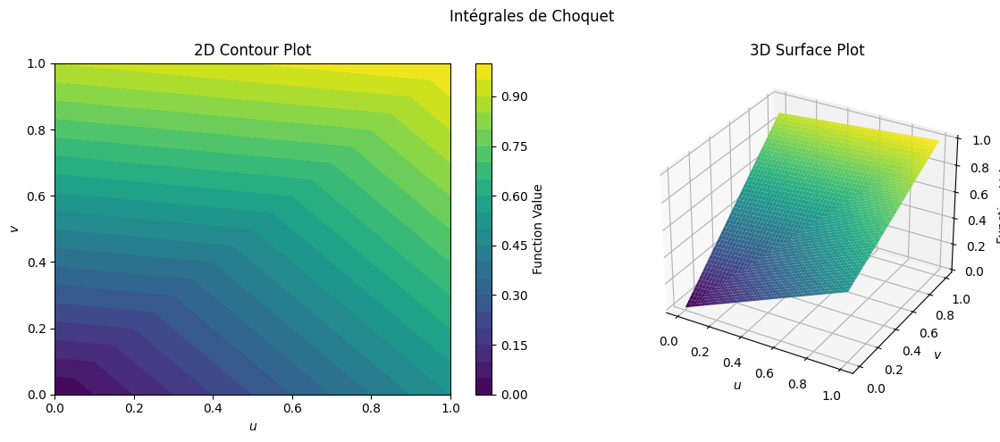

In [22]:
plot_level_lines(
    lambda x: choquet(x, mu), num_contours=20, title="Intégrales de Choquet"
)


<div class="alert alert-block alert-info">
    Commenter les résultats obtenus. 
</div>


C'est très joli, cela nous rend très heureux.


## B - LIME


<div class="alert alert-block alert-warning">
L'objet de cette 2ème partie de TME est de tester l'algorithme LIME sur une tâche de classification assez simple.
</div>


## 1 - Préparation du dataset

<div class="alert alert-block alert-warning">
    Nous allons utiliser les datasets <code>half-moons</code>, que vous savez manipuler, pour permettre la visualisation des résultats et <a href="https://archive.ics.uci.edu/ml/datasets/Breast+Cancer+Wisconsin+(Diagnostic)">UCI ML Breast Cancer Wisconsin (Diagnostic)</a> qui comporte plus d'attributs.
</div>


<div class="alert alert-block alert-info">
    Tout d'abord, exécuter le bloc ci-dessous pour importer la bibliothèque <code>datasets</code> de <code>sklearn</code>.
</div>


In [23]:
from sklearn import datasets


<div class="alert alert-block alert-info">
    Exécuter le bloc suivant pour charger les données <code>breast_cancer</code>.
 </div>


In [24]:
breast_cancer = datasets.load_breast_cancer()


<div class = "alert alert-block alert-info">
    Q1.1 - Visualiser le contenu de la variable <code>breast_cancer</code>.
</div>


In [25]:
breast_cancer.feature_names


array(['mean radius', 'mean texture', 'mean perimeter', 'mean area',
       'mean smoothness', 'mean compactness', 'mean concavity',
       'mean concave points', 'mean symmetry', 'mean fractal dimension',
       'radius error', 'texture error', 'perimeter error', 'area error',
       'smoothness error', 'compactness error', 'concavity error',
       'concave points error', 'symmetry error',
       'fractal dimension error', 'worst radius', 'worst texture',
       'worst perimeter', 'worst area', 'worst smoothness',
       'worst compactness', 'worst concavity', 'worst concave points',
       'worst symmetry', 'worst fractal dimension'], dtype='<U23')

<div class = "alert alert-block alert-info">
    Q1.2 - Définir les variables <code>X_train, X_test, y_train, y_test</code> avec <code>train_test_split</code> où vous utiliserez 25% des données pour le test.
</div>


In [26]:
from sklearn.model_selection import train_test_split


X_train, X_test, y_train, y_test = train_test_split(
    breast_cancer.data, breast_cancer.target, test_size=0.25, random_state=42
)


<div class = "alert alert-block alert-info">
    Q1.3 - Définir la variable <code>feature_names</code> contenant la liste des caractéristiques dans ce dataset ainsi que les noms de classes dans la variable <code>target_names</code>.
</div>


In [27]:
feature_names = breast_cancer.feature_names
target_names = breast_cancer.target_names


In [28]:
feature_names


array(['mean radius', 'mean texture', 'mean perimeter', 'mean area',
       'mean smoothness', 'mean compactness', 'mean concavity',
       'mean concave points', 'mean symmetry', 'mean fractal dimension',
       'radius error', 'texture error', 'perimeter error', 'area error',
       'smoothness error', 'compactness error', 'concavity error',
       'concave points error', 'symmetry error',
       'fractal dimension error', 'worst radius', 'worst texture',
       'worst perimeter', 'worst area', 'worst smoothness',
       'worst compactness', 'worst concavity', 'worst concave points',
       'worst symmetry', 'worst fractal dimension'], dtype='<U23')

In [29]:
target_names


array(['malignant', 'benign'], dtype='<U9')

## 2 - Apprentissage d'un modèle linéaire

<div class="alert alert-block alert-warning">
Nous allons apprendre la tâche de classification en utilisant un modèle de régression logistique.
</div>


<div class = "alert alert-block alert-info">
    Q2.1 - Apprendre un modèle <code>logreg</code> de régression logistique sur les données.
</div>


In [30]:
from sklearn.linear_model import LogisticRegression

logreg = LogisticRegression()
logreg.fit(X_train, y_train)


/home/charles/M2-DAC/.venv/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:460: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


LogisticRegression()

<div class = "alert alert-block alert-info">
    Q2.2 - Dans <code>y_pred</code>, calculer les prédictions sur les données de test.
</div>


In [31]:
y_pred = logreg.predict(X_test)


<div class = "alert alert-block alert-info">
    Q2.3 - Avec <code>confusion_matrix</code>, donner la matrice de confusion sur les données de test.
</div>


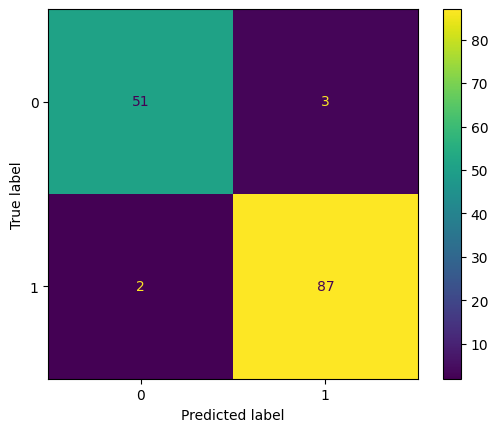

In [32]:
from sklearn.metrics import ConfusionMatrixDisplay

ConfusionMatrixDisplay.from_estimator(logreg, X_test, y_test)


<div class = "alert alert-block alert-info">
    Q2.3 - Avec <code>f1_score</code>, calculer le score f1.
</div>


In [33]:
from sklearn.metrics import f1_score

f1_score(y_test, y_pred, average="binary")


0.9720670391061451

<div class = "alert alert-block alert-info">
    Q2.4 - En utilisant les labels des caractéristiques du dataset, dessiner un diagramme en barre de l'importance de chaque caractéristique apprise par la régression logistique.
</div>


worst radius               1.170652
mean radius                1.122875
texture error              0.511433
mean texture               0.445324
mean perimeter             0.108955
perimeter error            0.070038
radius error               0.036704
smoothness error          -0.003886
fractal dimension error   -0.004103
mean area                 -0.009477
mean fractal dimension    -0.013211
symmetry error            -0.014806
concave points error      -0.015534
worst area                -0.019502
mean smoothness           -0.042225
compactness error         -0.043246
concavity error           -0.058245
worst fractal dimension   -0.058385
mean symmetry             -0.063300
worst smoothness          -0.076525
area error                -0.108267
mean concave points       -0.120848
worst perimeter           -0.134142
worst symmetry            -0.203862
mean compactness          -0.204125
worst concave points      -0.223582
mean concavity            -0.282153
worst texture             -0

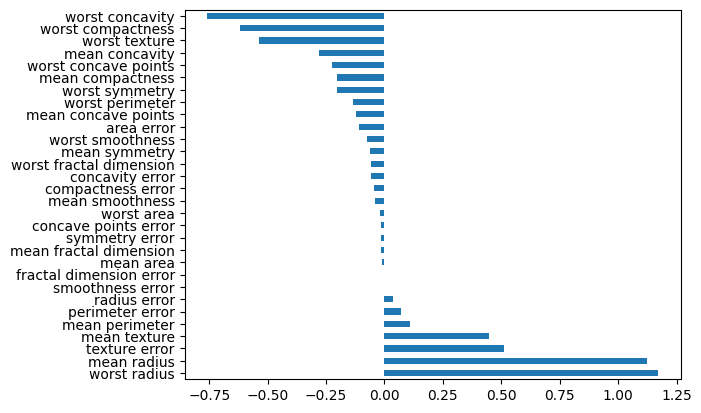

In [34]:
import pandas as pd

coefs = logreg.coef_[0]
pd.Series(coefs, index=feature_names).nlargest(coefs.size).plot(kind="barh")
pd.Series(coefs, index=feature_names).nlargest(coefs.size)


<div class = "alert alert-block alert-info">
    Q2.5 - De la même manière, donner les importances du premier exemple de la base de test.
</div>


<Axes: >

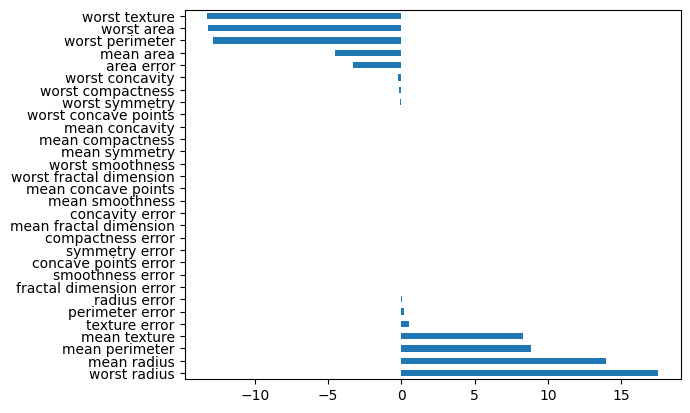

In [35]:
pd.Series(coefs * X_test[0], index=feature_names).nlargest(coefs.size).plot(kind="barh")


## 3 - Explication avec LIME

<div class="alert alert-block alert-warning">
Nous allons étudier une explication donnée par LIME.
</div>


<div class = "alert alert-block alert-info">
    Q3.1 - Exécuter le bloc ci-dessous pour obtenir une explication sur le premier exemple de la base de test. Commentez.
</div>


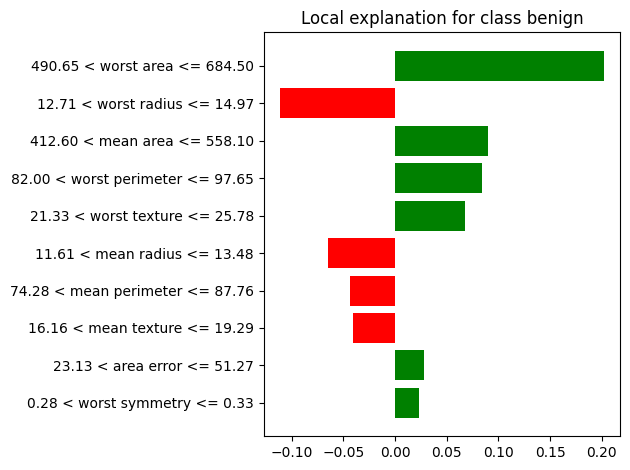

In [36]:
from lime.lime_tabular import LimeTabularExplainer

explainer = LimeTabularExplainer(
    X_test,
    feature_names=feature_names,
    class_names=target_names,
    categorical_features=[],
    mode="classification",
)

exp = explainer.explain_instance(X_test[0], logreg.predict_proba, num_features=10)
exp.as_pyplot_figure()
plt.tight_layout()


In [37]:
exp.show_in_notebook()


**Commentaire** : Le premier exemple de la base de test a été classifié tel que _begnin_ (1).

lime se demande si est ce que le fait que cet attribut soit dans cet intervalle qui est important, pas seulement la feature en elle même


<div class = "alert alert-block alert-info">
    Q3.2 - Comparer avec l'exemple suivant de la base de test.
</div>


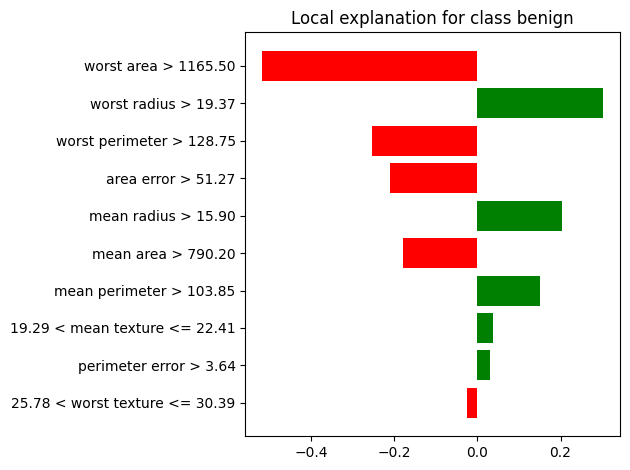

In [38]:
exp = explainer.explain_instance(X_test[1], logreg.predict_proba, num_features=10)
exp.as_pyplot_figure()
plt.tight_layout()


In [39]:
exp.show_in_notebook()


## 4 - Expérimentations

<div class="alert alert-block alert-info">
    Faire des tests pour examiner le comportement de LIME, par exemple pour examiner sa stabilité par rapport à la donné d'intérêt ou par rapport au classifieur, selon un protocole que vous définirez après avoir spécifié l'étude que vous souhaitez mener.
</div>


Nous allons étudier l'instabilité des explication donnée par LIME pour un même point


### Stabilité des features indiquées


In [40]:
from tqdm.autonotebook import tqdm

stable_df = pd.DataFrame()

for _ in tqdm(range(1000)):
    explainer = LimeTabularExplainer(
        X_test,
        feature_names=feature_names,
        class_names=target_names,
        categorical_features=[],
        mode="classification",
    )

    exp = explainer.explain_instance(X_test[0], logreg.predict_proba, num_features=10)
    tmp_array = np.array(exp.as_map()[1])
    tmp_df = pd.DataFrame(tmp_array[:, 1], index=tmp_array[:, 0]).T
    stable_df = pd.concat((stable_df, tmp_df))
stable_df


/tmp/ipykernel_15055/801619063.py:1: TqdmExperimentalWarning: Using `tqdm.autonotebook.tqdm` in notebook mode. Use `tqdm.tqdm` instead to force console mode (e.g. in jupyter console)
  from tqdm.autonotebook import tqdm


  0%|          | 0/1000 [00:00<?, ?it/s]

,23.0,20.0,22.0,0.0,3.0,2.0,21.0,11.0,25.0,13.0,...,14.0,28.0,7.0,8.0,24.0,26.0,9.0,5.0,17.0,19.0
0,0.207523,-0.102104,0.100570,-0.057638,0.055472,-0.054394,0.051031,-0.029118,-0.024389,0.024243,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
0,0.222664,-0.089819,0.133563,-0.094246,0.074361,-0.043793,0.057500,NaN,NaN,0.027482,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
0,0.226259,-0.084941,0.096766,-0.053645,0.063380,-0.045331,0.074914,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
0,0.197986,-0.102241,0.103943,-0.060935,0.050810,-0.046145,0.048388,NaN,NaN,0.045080,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
0,0.220568,-0.091725,0.096687,-0.069136,0.055861,-0.028213,0.063570,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
0,0.220201,-0.085351,0.094851,-0.049482,0.042997,-0.050429,0.043634,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.034607,0.023554,NaN
0,0.208669,-0.087518,0.093698,-0.064620,0.048516,-0.056557,0.069157,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,-0.023686,NaN,NaN,NaN,NaN,NaN
0,0.211811,-0.113319,0.093209,-0.061829,0.077038,-0.046829,0.041772,NaN,NaN,0.021386,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.017879
0,0.207331,-0.099338,0.076060,-0.064545,0.059022,-0.058899,0.061675,NaN,NaN,0.031516,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [41]:
d = {}
for col in stable_df.columns:
    d[col] = stable_df[col].isna().sum()
pd.Series(d).sort_values()


23.0      0
20.0      0
22.0      0
0.0       5
3.0       5
21.0     36
2.0     101
1.0     433
13.0    476
16.0    879
28.0    880
15.0    887
26.0    893
29.0    895
7.0     896
9.0     897
24.0    899
11.0    900
8.0     901
12.0    901
14.0    905
6.0     905
19.0    906
18.0    909
27.0    912
17.0    913
5.0     913
10.0    916
25.0    916
4.0     921
dtype: int64

On observe une stabilité sur les 5 premiers exemples donnés, ils ont pratiquement toujours été présent sur nos 1000 essais.

On observe que les features 1 et 13 ont quant à eux été présentes dans approximativement 50% des cas.

Pour le reste, il y aurait bien plus de variations, comme si la dernière feature était beaucoup plus aléatoire.


### Stabilité de la valeur associée à une features


Regardons à présent si les valeurs associées à ces features sont stables.

Dans un premier temps nous allons étudier les features "stables" qui ressorte à chaque explication. Puis dans un second temps celle plus variable.


#### Chez les features dites "stable"


,23.0,22.0,20.0,3.0,0.0,21.0,2.0
count,1000.000000,1000.000000,1000.000000,995.000000,995.000000,964.000000,899.000000
mean,0.213628,0.096175,-0.106336,0.061376,-0.062768,0.053566,-0.045376
std,0.014353,0.014916,0.014745,0.014333,0.014645,0.014385,0.011904
min,0.168901,0.050554,-0.158544,0.023402,-0.104622,0.019652,-0.087084
25%,0.204484,0.086433,-0.116025,0.051515,-0.072623,0.043235,-0.052286
50%,0.213378,0.096771,-0.106711,0.060973,-0.062680,0.053165,-0.044763
75%,0.223002,0.106164,-0.096566,0.071037,-0.053254,0.063149,-0.036809
max,0.256762,0.142092,-0.057673,0.109271,-0.021310,0.107820,-0.019845


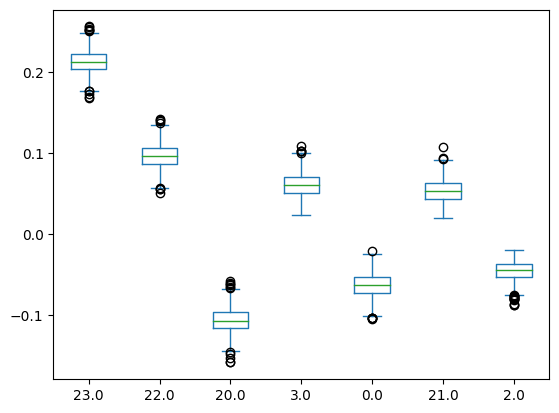

In [42]:
stable_features = [23, 22, 20, 3, 0, 21, 2]
stable_df[stable_features].plot.box()
stable_df[stable_features].describe()


La variance semble assez faible et est similaire pour chaque feature indiquée. On observe parfois quelques outliers mais rien de significatif sur 1000 runs. Il n'y en avait que très peu sur 100 runs.


#### Chez les features dites "instable"


,1.0,13.0,11.0,27.0,24.0,17.0
count,567.000000,524.000000,100.000000,88.000000,101.000000,87.000000
mean,-0.037083,0.036871,-0.021344,0.006244,0.003474,-0.002100
std,0.009945,0.010125,0.024159,0.029721,0.031465,0.030898
min,-0.070168,-0.035441,-0.052376,-0.046097,-0.053004,-0.057853
25%,-0.043249,0.030043,-0.035337,-0.026189,-0.029907,-0.029573
50%,-0.035616,0.035762,-0.030106,0.023180,0.022990,-0.021788
75%,-0.029493,0.042878,-0.023734,0.030766,0.031075,0.028925
max,-0.017952,0.077865,0.039381,0.047408,0.051327,0.040485


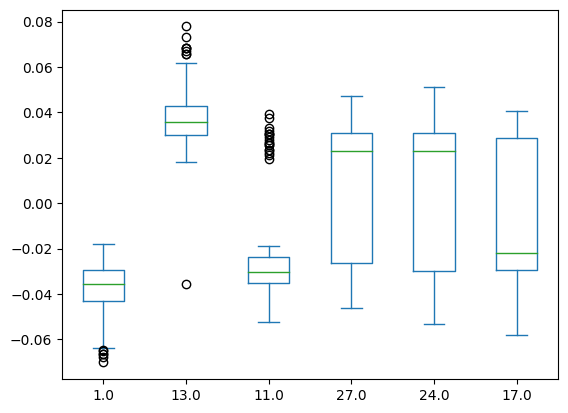

In [43]:
unstable_features = [1.0, 13.0, 11.0, 27.0, 24.0, 17.0]

stable_df[unstable_features].plot.box()
stable_df[unstable_features].describe()


Plot en comparaison avec les stables 

<Axes: >

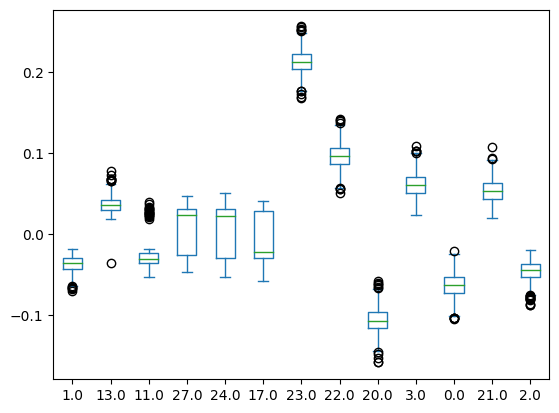

In [58]:
stable_df[unstable_features+stable_features].plot.box() 

En revanche, les conclusions sont plutôt inversées pour les features "instable". On observe que la variance est plus forte dans les classes instables, avec parfois beaucoup d'outliers.


## 5 - Données textuelles

<div class="alert alert-block alert-warning">
    Nous allons apprendre un modèle de classification random forest sur les données <code>fetch_20newsgroups</code> puis utiliser LIME pour obtenir des explications sur la classification d'exemples.
</div>


<div class = "alert alert-block alert-info">
À l'aide de la <a href="https://scikit-learn.org/stable/auto_examples/text/plot_document_classification_20newsgroups.html#sphx-glr-auto-examples-text-plot-document-classification-20newsgroups-py">documentation du dataset fetch_20newsgroups</a>,  apprendre un modèle random forest de classification bi-classe de texte.
</div>


In [44]:
from sklearn.datasets import fetch_20newsgroups
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import accuracy_score, classification_report

categories = ["sci.space", "sci.crypt"]
newsgroups_train = fetch_20newsgroups(
    subset="train", categories=categories, remove=("headers", "footers", "quotes")
)
newsgroups_test = fetch_20newsgroups(
    subset="test", categories=categories, remove=("headers", "footers", "quotes")
)


In [45]:
import nltk
from nltk.corpus import stopwords

nltk.download("stopwords")


[nltk_data] Downloading package stopwords to
[nltk_data]     /home/charles/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


True

On utilise des **stopwords** afin d'éliminer les mots courants (tels que _is_, _this_, etc.) qui risquerait d'introduire du bruit dans l'analyse textuelle et afin d'améliorer notre classifieur.


In [46]:
vectorizer = TfidfVectorizer(lowercase=False, stop_words=stopwords.words("english"))
train_vectors = vectorizer.fit_transform(newsgroups_train.data)
test_vectors = vectorizer.transform(newsgroups_test.data)

rf = RandomForestClassifier(n_estimators=500, random_state=42, n_jobs=-1)
rf.fit(train_vectors, newsgroups_train.target)


RandomForestClassifier(n_estimators=500, n_jobs=-1, random_state=42)

In [47]:
y_pred = rf.predict(test_vectors)
accuracy = accuracy_score(newsgroups_test.target, y_pred)
print(f"Accuracy: {accuracy:.2f}")

report = classification_report(
    newsgroups_test.target, y_pred, target_names=newsgroups_test.target_names
)
print("Classification Report:\n", report)


Accuracy: 0.88
Classification Report:
               precision    recall  f1-score   support

   sci.crypt       0.95      0.80      0.87       396
   sci.space       0.83      0.96      0.89       394

    accuracy                           0.88       790
   macro avg       0.89      0.88      0.88       790
weighted avg       0.89      0.88      0.88       790



[Text(0, 0, 'sci.space'), Text(0, 1, 'sci.crypt')]

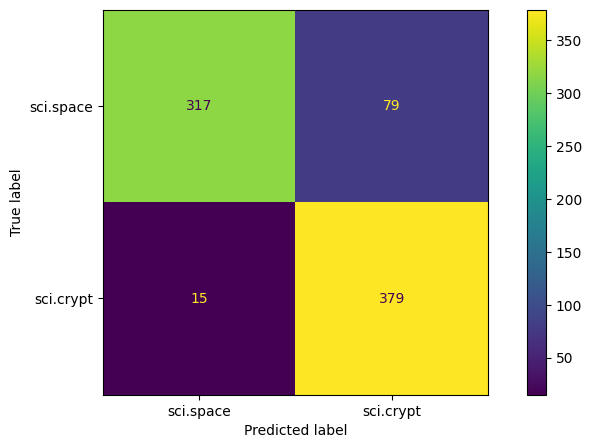

In [48]:
fig, ax = plt.subplots(figsize=(10, 5))
ConfusionMatrixDisplay.from_predictions(newsgroups_test.target, y_pred, ax=ax)
ax.xaxis.set_ticklabels(categories)
ax.yaxis.set_ticklabels(categories)


In [49]:
y_pred[69], newsgroups_test.target[69], newsgroups_test.target_names


(0, 0, ['sci.crypt', 'sci.space'])

<div class = "alert alert-block alert-info">
Utilisez LIME pour obtenir des explications sur les prédictions obtenues sur des exemples.
</div>


In [50]:
from lime.lime_text import LimeTextExplainer
from sklearn.pipeline import make_pipeline

c = make_pipeline(vectorizer, rf)
explainer = LimeTextExplainer(class_names=newsgroups_test.target_names)


In [51]:
idx = 69
exp = explainer.explain_instance(
    newsgroups_test.data[idx], c.predict_proba, num_features=6
)
print(f"Document id: {idx}")
print(
    f"Probability(sci.space) = {c.predict_proba([newsgroups_test.data[idx]])[0, 1]:.4f}"
)
print(f"True class: {newsgroups_test.target_names[newsgroups_test.target[idx]]}")


Document id: 69
Probability(sci.space) = 0.2133
True class: sci.crypt


Ici, le classifieur a prédit la bonne classe (`sci.crypt`). L'explication est présentée ci-dessous sous forme d'une liste de caractéristiques pondérées.


In [52]:
exp.as_list()


[('Clipper', -0.12466553316922306),
 ('keys', -0.10972631466534995),
 ('phone', -0.07562110706716539),
 ('warrant', -0.034264413717602624),
 ('The', 0.02839030071527263),
 ('care', -0.028167557549588735)]

Ces caractéristiques pondérées sont un modèle linéaire qui approxime le comportement du classificateur de forêt aléatoire à proximité de l'exemple de test. En gros, si nous supprimons `Clipper` et `keys` du document, la prédiction devrait se déplacer vers la classe opposée (`sci.space`) d'environ 0.23 (la somme des poids pour les deux caractéristiques). Voyons si c'est le cas.


In [53]:
print(f"Original prediction: {rf.predict_proba(test_vectors[idx])[0, 1]:.4f}")
tmp = test_vectors[idx].copy()
tmp[0, vectorizer.vocabulary_["Clipper"]] = 0
tmp[0, vectorizer.vocabulary_["keys"]] = 0
print(f"Prediction removing some features: {rf.predict_proba(tmp)[0, 1]:.4f}")
print(
    f"Difference: {rf.predict_proba(tmp)[0, 1] - rf.predict_proba(test_vectors[idx])[0, 1]:.4f}"
)


Original prediction: 0.2133
Prediction removing some features: 0.3948
Difference: 0.1814


In [54]:
exp.show_in_notebook()


In [55]:
idx = 77
exp = explainer.explain_instance(
    newsgroups_test.data[idx], c.predict_proba, num_features=6
)
print(f"Document id: {idx}")
print(f"Probability(sci.crypt) = {c.predict_proba([newsgroups_test.data[idx]])[0, 1]}")
print(f"True class: {categories[newsgroups_test.target[idx]]}")
exp.show_in_notebook()


Document id: 77
Probability(sci.crypt) = 0.525617696247463
True class: sci.crypt


https://github.com/marcotcr/lime/blob/master/doc/notebooks/Lime%20-%20basic%20usage%2C%20two%20class%20case.ipynb


## 6 - Implémentation de LIME

<div class="alert alert-block alert-info">
    Sur des données textuelles, implémentez une version rudimentaire de LIME en utilisant la fonction de proximité proposée dans le cours. Retrouvez-vous les mêmes vecteurs d'importance qu'avec la bibliothèque LIME ?
</div>


In [56]:
from copy import copy
from sklearn.linear_model import Ridge

# Nom des fonctions issus de la notation du cours
class CustomLimeTextExplainer:
    def __init__(self, class_names, vectorizer, card_Z=10000):
        self.class_names = class_names
        self.vectorizer = vectorizer  # Obligé de l'inclure ici car j'ai besoin de transform le text pour fit le clf linéaire
        self.card_Z = card_Z

    def generate_z(self, text_instance):
        modified_text_instances = []
        weights = []
        splited_text = text_instance.split(" ")
        nb_mot = len(splited_text)
        sigma = int(
            0.75 * np.sqrt(nb_mot)
        )  # on vas changer maximum sigma nombre de mot dans la phrase
        for _ in range(self.card_Z):
            splited_text_tmp = copy(splited_text)
            nb_word_to_change = np.random.randint(0, sigma)
            index_to_remove = np.random.randint(0, nb_mot, size=nb_word_to_change)
            for i in index_to_remove:
                splited_text_tmp[i] = ""
            modified_text_instances.append(" ".join(splited_text_tmp))
            weights.append(1 - nb_word_to_change / nb_mot)
        return modified_text_instances, weights

    def train_g(self):
        ...

    def explain_instance(self, text_instance, classifier_fn, num_features=None):
        modified_text_instances, weights = self.generate_z(text_instance)
        prob = classifier_fn(modified_text_instances).max(1)
        clf = Ridge(fit_intercept=True)
        clf.fit(
            self.vectorizer.transform(modified_text_instances),
            prob,
            sample_weight=weights,
        )
        return pd.Series(clf.coef_, index=vectorizer.get_feature_names_out())


explainer = CustomLimeTextExplainer(
    class_names=newsgroups_test.target_names, vectorizer=vectorizer
)
coef = explainer.explain_instance(
    newsgroups_test.data[idx], c.predict_proba, num_features=6
)


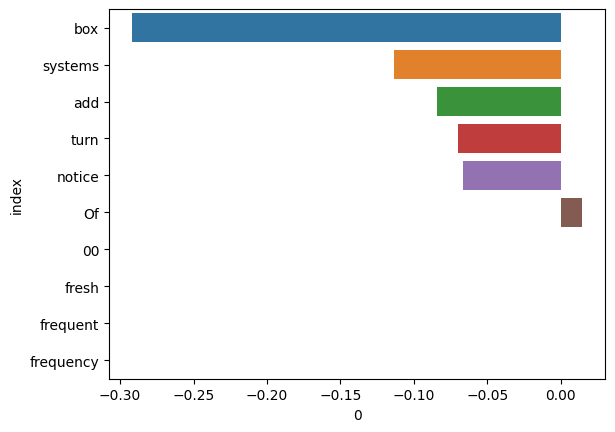

In [57]:
top5 = coef.sort_values()[:5]
less5 = coef.sort_values(ascending=False)[:5]
to_plot = pd.DataFrame(pd.concat((top5, less5))).reset_index()
import seaborn as sns

sns.barplot(data=pd.DataFrame(to_plot).reset_index(), x=0, y="index")
exp.show_in_notebook()


On retrouve les résultats précédents !
